**Nurhanie Syakirah binti Rosnei**

**S2132021**

**Principle of Data Science**

**Universiti Malaya**

In [389]:
import pandas as pd
import numpy as np
import plotly
from plotly import tools
import matplotlib.pyplot as plt
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
#import plotly.plotly as py
import plotly.figure_factory as ff
from chart_studio import plotly


df = pd.read_csv("studentmat.csv")
df.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10


In [390]:
print(df.shape)

(395, 33)


**Information about the variables in datasets:**

1 school - student's school (binary: 'GP' - Gabriel Pereira or 'MS' - Mousinho da Silveira)

2 sex - student's sex (binary: 'F' - female or 'M' - male)

3 age - student's age (numeric: from 15 to 22)

4 address - student's home address type (binary: 'U' - urban or 'R' - rural)

5 famsize - family size (binary: 'LE3' - less or equal to 3 or 'GT3' - greater than 3)

6 Pstatus - parent's cohabitation status (binary: 'T' - living together or 'A' - apart)

7 Medu - mother's education (numeric: 0 - none, 1 - primary education (4th grade), 2 - 5th to 9th grade, 3 - secondary education or 4 - higher education)

8 Fedu - father's education (numeric: 0 - none, 1 - primary education (4th grade), 2 - 5th to 9th grade, 3 - secondary education or 4 - higher education)

9 Mjob - mother's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')

10 Fjob - father's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')

11 reason - reason to choose this school (nominal: close to 'home', school 'reputation', 'course' preference or 'other')

12 guardian - student's guardian (nominal: 'mother', 'father' or 'other')

13 traveltime - home to school travel time (numeric: 1 - <15 min., 2 - 15 to 30 min., 3 - 30 min. to 1 hour, or 4 - >1 hour)

14 studytime - weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)

15 failures - number of past class failures (numeric: n if 1<=n<3, else 4)

16 schoolsup - extra educational support (binary: yes or no)

17 famsup - family educational support (binary: yes or no)

18 paid - extra paid classes within the course subject (Math or Portuguese) (binary: yes or no)

19 activities - extra-curricular activities (binary: yes or no)

20 nursery - attended nursery school (binary: yes or no)

21 higher - wants to take higher education (binary: yes or no)

22 internet - Internet access at home (binary: yes or no)

23 romantic - with a romantic relationship (binary: yes or no)

24 famrel - quality of family relationships (numeric: from 1 - very bad to 5 - excellent)

25 freetime - free time after school (numeric: from 1 - very low to 5 - very high)

26 goout - going out with friends (numeric: from 1 - very low to 5 - very high)

27 Dalc - workday alcohol consumption (numeric: from 1 - very low to 5 - very high)

28 Walc - weekend alcohol consumption (numeric: from 1 - very low to 5 - very high)

29 health - current health status (numeric: from 1 - very bad to 5 - very good)

30 absences - number of school absences (numeric: from 0 to 93)

**These grades are related with the course subject, Math or Portuguese:**

31 G1 - first period grade (numeric: from 0 to 20)

31 G2 - second period grade (numeric: from 0 to 20)

32 G3 - final grade (numeric: from 0 to 20, output target)

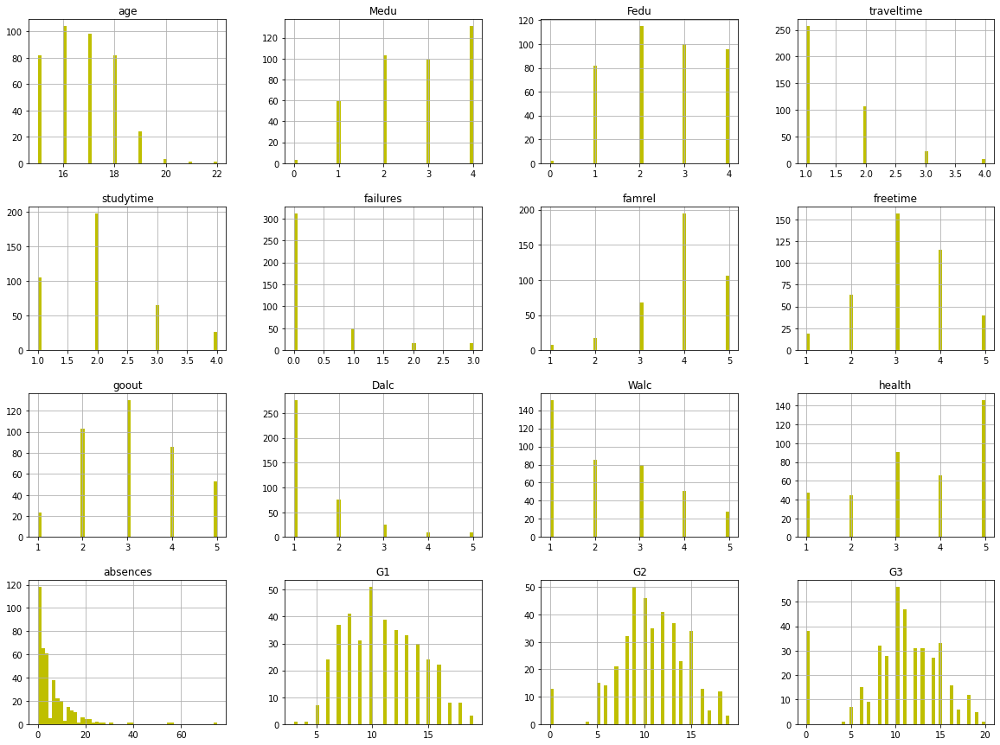

In [391]:
##Distribution of data

df.hist(bins=50, figsize=(20,15), color='y')
plt.show()

**Distribution of G1, G2 and G3**

Assuming that everything lower than 12 is a "Failing Grade". If the grade is greater or equal to 12 then this will be a "Passing" grade.

**It is to answer the following questions**

1) Did students that failed in the first period improved in the second and third period?

2) How many students got each grade and what grade did most of the students got.

3) In which of the periods did students failed the most.

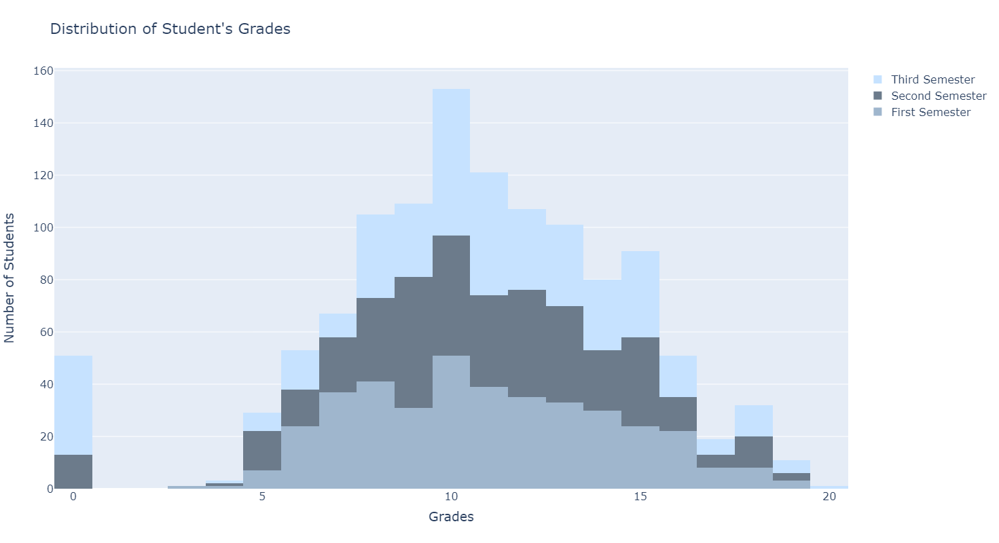

In [393]:
init_notebook_mode()

#cf.set_config_file(offline=False, world_readable=True, theme='pearl')

x1 = df["G1"]
x2 = df["G2"]
x3 = df["G3"]

First_Period = Histogram(
    x=x1,
    name="First Semester",
    marker= dict(
        color='#9FB6CD',
    )
)

Second_Period = Histogram(
    x=x2,
    name="Second Semester",
    marker= dict(
        color='#6C7B8B',
    )
)

Third_Period = Histogram(
    x=x3,
    name="Third Semester",
    marker= dict(
        color='#C6E2FF',

    )
)

data = [First_Period, Second_Period, Third_Period]
layout = Layout(barmode='stack',title="Distribution of Student's Grades", font=dict(size=16), xaxis=dict(title="Grades"),yaxis=dict(title="Number of Students"), height=800, width=700)

fig = dict(data=data, layout=layout)
iplot(fig)

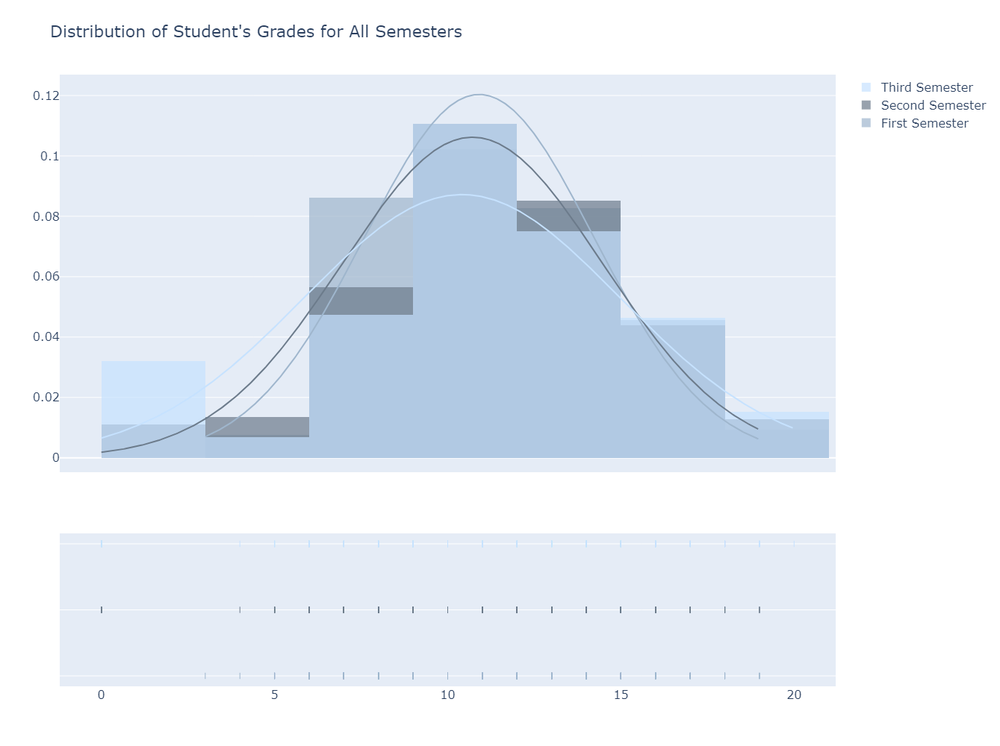

In [353]:
init_notebook_mode()

# Add histogram data
x1 = df['G1'].values.tolist() 
x2 = df['G2'].values.tolist()  
x3 = df['G3'].values.tolist()    


# Group data together
hist_data = [x1, x2, x3]

group_labels = ['First Semester', 'Second Semester', 'Third Semester']

colors = ["#9FB6CD", "#6C7B8B", "#C6E2FF"]

# # Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=3, curve_type='normal', colors=colors)
fig['layout'].update(title="Distribution of Student's Grades for All Semesters", font=dict(size=16),height=1000, width=650)

# # Plot!
iplot(fig)

In [354]:
df.drop(['G1', 'G2'], axis=1, inplace=True)

In [355]:
df.columns

Index(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'Dalc',
       'Walc', 'health', 'absences', 'G3'],
      dtype='object')

**Dropping Columns that are not highly correlated**

1) Here we will find out the columns that are highly correlated (either positively or negatively) in order to leave it in our dataframe.

2) We should have a criteria in order to retain the columns. Let's say if the column is correlated more than 8% to G3 we retain the column for further analysis.

3) Some columns that are not highly correlated might stay to see if we could develop new features by combining 2 or more columns.

4) We will drop the columns G1 and G2 since we already know this is highly indicative of what G3 will be. We want to find out other features that could have a positive impact

5) The columns that are in binary format we will convert it into numeric in a new column to see if they have a high correlation with G3.

In [356]:
# 0 stands for U and 1 stands for R. [U=Urban, R=Rural]
# Here we will convert all the binary columns to integers.
df['b_address'] = df['address'].apply(lambda x: 0 if x == 'U' else 1)
df['b_address'].value_counts()
# Interestingly there are more students in families that are greater than 3.
# Could it be possible that all family members are in the same school? This might be a reason why it is higher.
# LE3 = Less than 3. [0], GE3 = Greater than 3.[1]
df['b_famsize'] = df['famsize'].apply(lambda x: 0 if x == 'LE3' else 1)
df['b_famsize'].value_counts()
# T = Parents are living together [0], A = Parents living apart. [1]
df['b_Pstatus'] = df['Pstatus'].apply(lambda x: 0 if x == 'T' else 1)
df['b_Pstatus'].value_counts()
# 0 = no and 1 = yes
df['b_famsup'] = df['famsup'].apply(lambda x: 0 if x == 'no' else 1)
df['b_famsup'].value_counts()
# 0 = no and 1 = yes
# This is an interesting column when it comes to having a positive effect on G3.
df['b_paidxtraclasses'] = df['paid'].apply(lambda x: 0 if x == 'no' else 1)
df['b_paidxtraclasses'].value_counts()
# 0 = no and 1 = yes
df['b_xtraactivities'] = df['activities'].apply(lambda x: 0 if x == 'no' else 1)
df['b_xtraactivities'].value_counts()
# 0 = no and 1 = yes
# It has a high correlation however, we only have 20 students that are not interested in having a high education and 
# thus this column should not be taken into consideration.
df['b_higher_education'] = df['higher'].apply(lambda x: 0 if x == 'no' else 1)
# continue with the analisis.
df['b_internet'] = df['internet'].apply(lambda x: 0 if x == 'no' else 1)
# Interestingly when people are not in a romantic relationship they tend to get better grades.
df['b_romantic'] = df['romantic'].apply(lambda x: 0 if x == 'no' else 1)

df['b_nursery'] = df['nursery'].apply(lambda x: 0 if x == 'no' else 1)

df['b_guardian'] = df['guardian'].apply(lambda x: 0 if x == 'mother' else (1 if x=='father' else 2))
# Does not have any effect on G3. Low correlation.
df['b_reason'] = df['reason'].apply(lambda x: 0 if x == 'home' else (1 if x=='reputation' else (3 if x=='course' else 4)))
# Does not have any effect on G3. Low correlation.
df['b_school'] = df['school'].apply(lambda x: 0 if x == 'GP' else 1)

df['b_schoolsup'] = df['schoolsup'].apply(lambda x: 0 if x == 'no' else 1)

**What binary columns influenced the G3 grade:**

1) Higher education [higher]: Students that were aiming in having a higher education tended to get better results in the final grade. However, we have to take into consideration that only 20 students were not aiming for higher education. Nevertheless, this feature can give us a hint as to whether a student will get higher grades or not.

2) Paid extra Classes [paid]: These are the extra paid classes within the course sibject. It has a positive correlation whichmeans the more the students took the extra classes the more likely they were to pass.

3) People in a relationship [romantic]: The people that were not in a romantic relationship tended to get higher grades than the ones that were in a relationship.

In [357]:
new_corr = df.corr()
new_corr['G3'].sort_values(ascending=False)

G3                    1.000000
Medu                  0.217147
b_higher_education    0.182465
Fedu                  0.152457
b_paidxtraclasses     0.101996
b_internet            0.098483
studytime             0.097820
b_Pstatus             0.058009
b_nursery             0.051568
famrel                0.051363
absences              0.034247
b_xtraactivities      0.016100
freetime              0.011307
b_reason             -0.028738
b_famsup             -0.039157
b_school             -0.045017
Walc                 -0.051939
b_guardian           -0.054193
Dalc                 -0.054660
health               -0.061335
b_famsize            -0.081407
b_schoolsup          -0.082788
b_address            -0.105756
traveltime           -0.117142
b_romantic           -0.129970
goout                -0.132791
age                  -0.161579
failures             -0.360415
Name: G3, dtype: float64

**Now let's drop the Columns that we don't need or that dont have a high correlation with G3**

In [358]:
df = df.drop(['school', 'b_school', 'address', 'famsize', 'b_famsize', 'Pstatus', 'reason', 'b_reason',
        'guardian', 'b_guardian', 'famsup', 'b_famsup', 'paid', 'activities', 'b_xtraactivities', 'nursery', 'b_nursery',
        'higher', 'internet', 'romantic', 'famrel', 'freetime'], axis=1)

In [359]:
df.shape

(395, 23)

In [360]:
#rename the column
df = df.rename(columns={'b_address': 'address', 'b_paidxtraclasses': 'paid_classes', 'b_higher_education': 'higher_education',
          'b_internet': 'internet_availability', 'b_romantic': 'relationship', 'b_schoolsup': 'educational_support','b_Pstatus':'pcohabitation_status'})

df.columns

Index(['sex', 'age', 'Medu', 'Fedu', 'Mjob', 'Fjob', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'goout', 'Dalc', 'Walc', 'health', 'absences',
       'G3', 'address', 'pcohabitation_status', 'paid_classes',
       'higher_education', 'internet_availability', 'relationship',
       'educational_support'],
      dtype='object')

In [361]:
# Simplit data into training and test set
# Use random_state so that everytime we run the data we get the exact same split of the data. 
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(df, test_size=0.3, random_state=42)

print(len(train_set), 'Train', len(test_set))

276 Train 119


In [362]:
correlations = df.corr()
correlations['G3'].sort_values(ascending=False)

G3                       1.000000
Medu                     0.217147
higher_education         0.182465
Fedu                     0.152457
paid_classes             0.101996
internet_availability    0.098483
studytime                0.097820
pcohabitation_status     0.058009
absences                 0.034247
Walc                    -0.051939
Dalc                    -0.054660
health                  -0.061335
educational_support     -0.082788
address                 -0.105756
traveltime              -0.117142
relationship            -0.129970
goout                   -0.132791
age                     -0.161579
failures                -0.360415
Name: G3, dtype: float64

Here we learn that the highest correlations or the attributes that impact the most the final grade (G3) are "Medu" (Education of the Mother) [Positive Correlation] and "failures[negative correlation]"

In [363]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(df, df["Medu"]):
    strat_train_set = df.loc[train_index]
    strat_test_set = df.loc[test_index] 

for train_index, test_index in split.split(df, df["failures"]):
    strat_train_set = df.loc[train_index]
    strat_test_set = df.loc[test_index]

In [364]:
print(df['Medu'].value_counts()/len(df))
print(df['failures'].value_counts()/len(df))

4    0.331646
2    0.260759
3    0.250633
1    0.149367
0    0.007595
Name: Medu, dtype: float64
0    0.789873
1    0.126582
2    0.043038
3    0.040506
Name: failures, dtype: float64


**Let's Create a Column that tells if the Student Passed or Fail**

Our criteria is x < 12 = Failed , x > 12 = Passed

In [365]:
df['grade_status'] = df['G3'].apply(lambda x: 'Fail' if x < 12 else 'Pass')
df['grade_status'].value_counts()

Fail    233
Pass    162
Name: grade_status, dtype: int64

In [366]:
# Move the grade_status and G3 columns to the 1st and 2nd columns just for visualization.
lst_c = df.columns.tolist()

df = df[
['G3',
 'grade_status',
 'sex',
 'age',
 'Medu',
 'Fedu',
 'Mjob',
 'Fjob',
 'traveltime',
 'studytime',
 'failures',
 'schoolsup',
 'goout',
 'Dalc',
 'Walc',
 'health',
 'absences',
 'address',
 'paid_classes',
 'higher_education',
 'internet_availability',
 'pcohabitation_status',
 'relationship',
 'educational_support']
]

**Why would we want to know how many students passed or fail?**

1) We want to know if there needs an improvement in the method of education at both Portuguese schools.

2) Is the gap between students that passed and failed close enough?

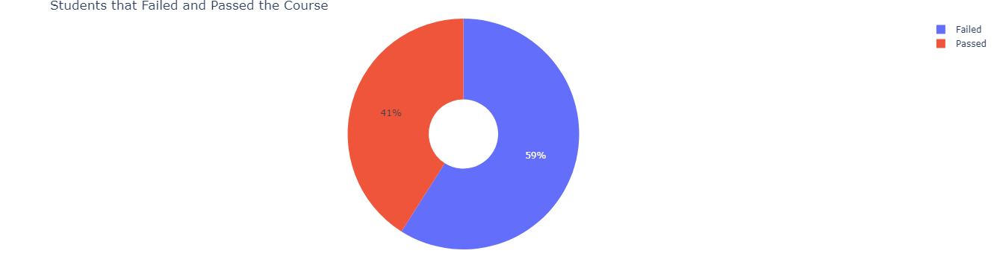

In [367]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

labels = ['Failed','Passed']
F = df['grade_status'].value_counts()[0]
P = df['grade_status'].value_counts()[1]
values = [F, P]

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_layout(title='Students that Failed and Passed the Course', margin=dict(t=25, b=25, l=25, r=25))
fig = go.Figure(fig)
fig.show()

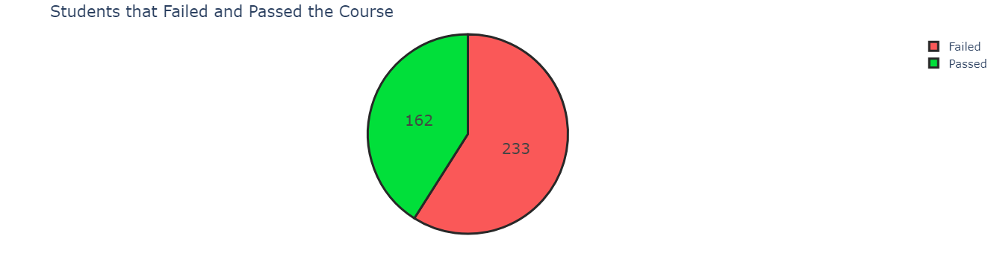

In [368]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()

labels = ['Failed','Passed']
F = df['grade_status'].value_counts()[0]
P = df['grade_status'].value_counts()[1]
values = [F, P]
colors = ['#FA5858', '#01DF3A']

trace = Pie(labels=labels, values=values,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=20),
               marker=dict(colors=colors, 
                           line=dict(color='#282828', width=3)))

data = [trace]
layout = Layout(
    title='Students that Failed and Passed the Course',
    font=dict(size=15),
    margin=dict(t=46, b=46, l=46, r=46)
)


fig = dict(data=data, layout=layout)
iplot(fig)

In [369]:
cross_sex = pd.crosstab(df['sex'], df['grade_status']).apply(lambda x: x/x.sum() * 100, axis=1)
cross_sex.iloc[1][0]

52.94117647058824

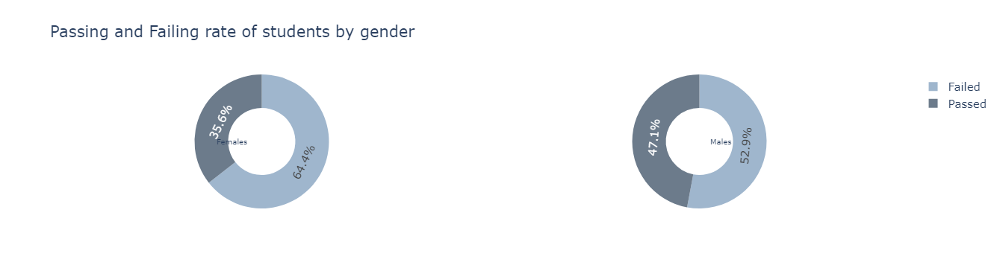

In [370]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()

F_Failed = cross_sex.iloc[0][0]
F_Passed = cross_sex.iloc[0][1]
M_Failed = cross_sex.iloc[1][0]
M_Passed = cross_sex.iloc[1][1]

colors = ["#9FB6CD", "#6C7B8B"]

fig = {"data": [{"values": [F_Failed, F_Passed],"labels": ["Failed","Passed"],"domain": {"x": [0, .48]},"name": "Females","marker": {"colors": colors},"hoverinfo":"label+percent+name","hole": .5,"type": "pie"},     
    {"values": [M_Failed, M_Passed],"labels": ["Failed","Passed"],"textposition":"inside","domain": {"x": [.52, 1]},"name": "Males","marker": {"colors": colors},"hoverinfo":"label+percent+name","hole": .5,"type": "pie"}],
  "layout": {"title":"Passing and Failing rate of students by gender","font": dict(size=15),"annotations": [{"font": { "size": 10}, "showarrow": False,"text": "Females", "x": 0.185, "y": 0.5}, {"font": {"size": 10},"showarrow": False,"text": "Males","x": 0.8, "y": 0.5}]}}

iplot(fig)

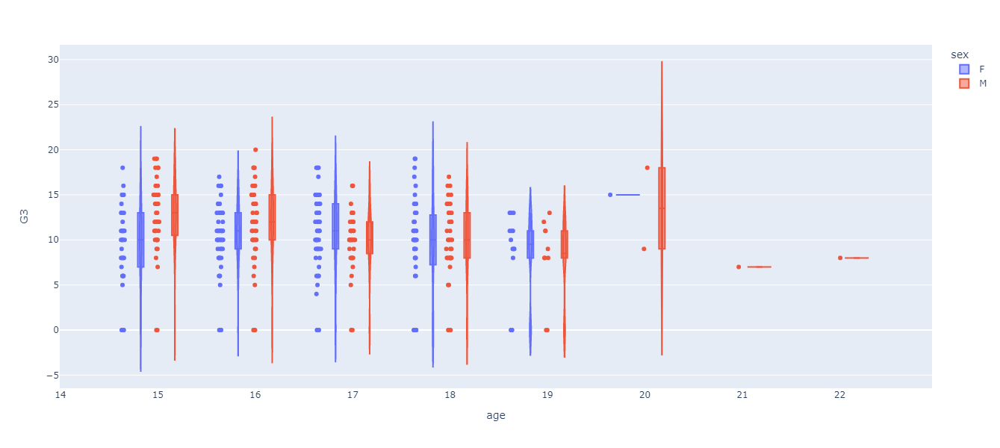

In [371]:
fig = px.violin(df, y="G3", x="age", color="sex", box=True, points="all", hover_data=df.columns, height=600, width=1300)
fig.show()

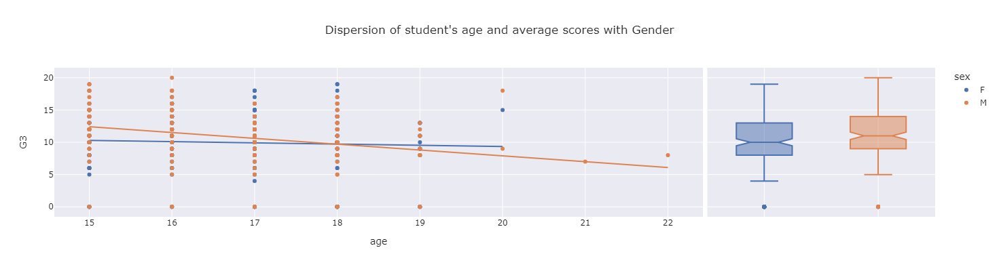

In [385]:
fig = px.scatter(df, 
                 x="age", 
                 y="G3", 
                 color="sex",
                 marginal_y="box", 
                 template="seaborn", 
                 trendline="ols",
                 title="Dispersion of student's age and average scores with Gender",
                 width=900, height=400)
fig.show()

**What can we learn from both Charts?:**

1) There are more students that failed rather than passed.

2) Females had a wider gap in failing the Math program than the Males.


In [378]:
import seaborn as sns

corr_matrix = df.corr()
corr_matrix['G3'].sort_values(ascending=False)

G3                       1.000000
Medu                     0.217147
higher_education         0.182465
Fedu                     0.152457
paid_classes             0.101996
internet_availability    0.098483
studytime                0.097820
pcohabitation_status     0.058009
absences                 0.034247
Walc                    -0.051939
Dalc                    -0.054660
health                  -0.061335
educational_support     -0.082788
address                 -0.105756
traveltime              -0.117142
relationship            -0.129970
goout                   -0.132791
age                     -0.161579
failures                -0.360415
Name: G3, dtype: float64

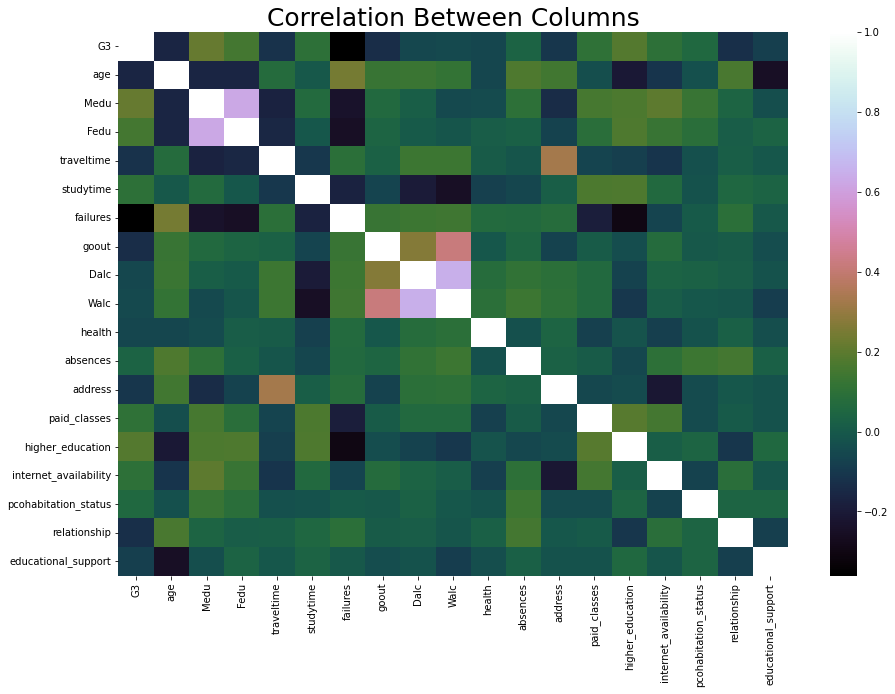

In [379]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(corr_matrix,
           xticklabels=corr_matrix.columns.values,
           yticklabels = corr_matrix.columns.values,
            ax = ax, cmap="cubehelix"
           ).set_title("Correlation Between Columns",fontsize=25)


plt.show()

**What insights can we gain from the Heatmap:**

1) Medu (Mother's Education) is the highest positive correlation with regards to G3 and hence this is why it is the "lighter green" square in the G3 column.
         
2) Let's see if "Medu" was a significant factor in why Females failed the course.

**Positive Correlations:**

1) Here we can see some interesting insights: Medu (Mothers education) seems to be the feature that impacts the most on a student to get better grades. Fedu (Fathers education) is the second feature that impacts the most on a student's grade.

2) Studytime also influences positively the outcome of G3.

In [374]:
#mother's education (numeric: 0 - none, 1 - primary education (4th grade), 2 - 5th to 9th grade, 3 - secondary education or 4 - higher education)
cross_medu = pd.crosstab(df['Medu'], df['sex']).apply(lambda x: x/x.sum() * 100)
cross_medu

sex,F,M
Medu,,
0,0.961538,0.534759
1,15.384615,14.438503
2,28.846154,22.994652
3,25.480769,24.598930
4,29.326923,37.433155


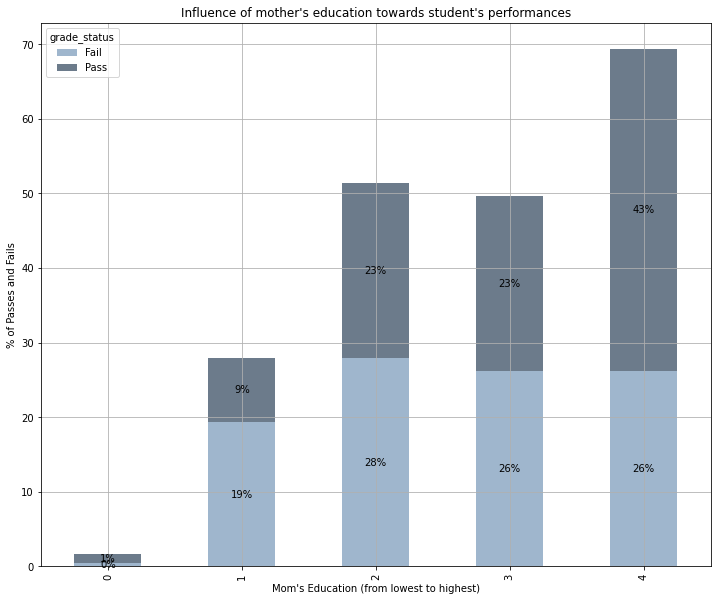

In [377]:
colors = ["#9FB6CD", "#6C7B8B"]
ct = pd.crosstab(df.Medu, df.grade_status).apply(lambda x: x/x.sum() * 100)

ax = ct.plot.bar(stacked=True, grid=True, color=colors, figsize=(12,10))
ax.set(xlabel="Mom's Education (from lowest to highest)", ylabel='% of Passes and Fails', title="Influence of mother's education towards student's performances")

# iterate through each bar container
for c in ax.containers:
    # add the annotations
    ax.bar_label(c, fmt='%0.0f%%', label_type='center')
    
plt.show()

In [303]:
#Fedu - father's education (numeric: 0 - none, 1 - primary education (4th grade), 2 - 5th to 9th grade, 3 - secondary education or 4 - higher education)
cross_fedu = pd.crosstab(df['Fedu'], df['grade_status']).apply(lambda x: x/x.sum() * 100)
cross_fedu

grade_status,Fail,Pass
Fedu,,
0,0.429185,0.617284
1,24.463519,15.432099
2,29.613734,28.395062
3,26.609442,23.456790
4,18.884120,32.098765


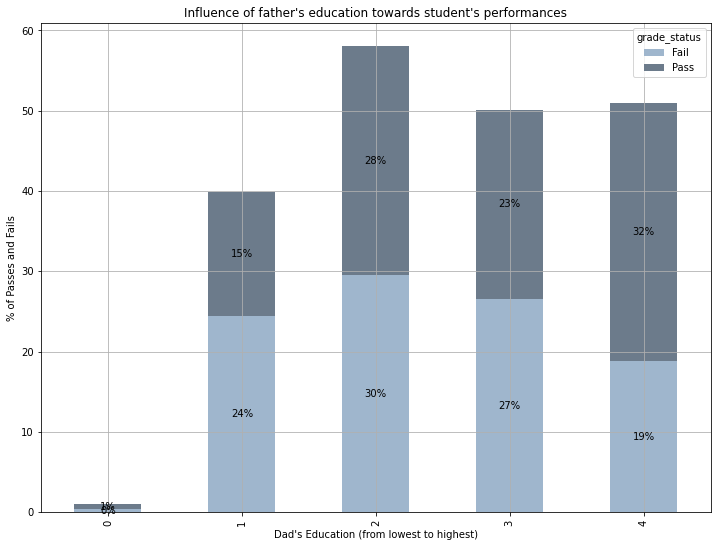

In [386]:
colors = ["#9FB6CD", "#6C7B8B"]
cf = pd.crosstab(df.Fedu, df.grade_status).apply(lambda x: x/x.sum() * 100)

ax = cf.plot.bar(stacked=True, grid=True, color=colors, figsize=(12,9))
ax.set(xlabel="Dad's Education (from lowest to highest)", ylabel='% of Passes and Fails', title="Influence of father's education towards student's performances")

# iterate through each bar container
for c in ax.containers:
    # add the annotations
    ax.bar_label(c, fmt='%0.0f%%', label_type='center')
    
plt.show()

In [305]:
# Let's see how the students that receive educational support performed did they passed or fail?
cross_edus = pd.crosstab(df['educational_support'], df['sex']).apply(lambda x: x/x.sum() * 100)
cross_edus

sex,F,M
educational_support,,
0,82.692308,91.97861
1,17.307692,8.02139


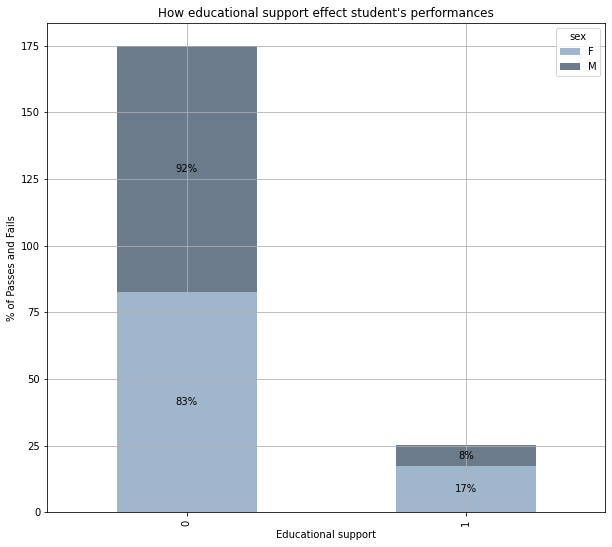

In [387]:
colors = ["#9FB6CD", "#6C7B8B"]
ce = pd.crosstab(df.educational_support, df.sex).apply(lambda x: x/x.sum() * 100)

ax = ce.plot.bar(stacked=True, grid=True, color=colors, figsize=(10,9))
ax.set(xlabel="Educational support", ylabel='% of Passes and Fails', title="How educational support effect student's performances")

# iterate through each bar container
for c in ax.containers:
    # add the annotations
    ax.bar_label(c, fmt='%0.0f%%', label_type='center')
    
plt.show()

In [307]:
# Let's see how effective are the paid classes.
# The same % of people who dont take paid classes Fail as the people who pay for classes the paid classes are not effective.
cross_paid = pd.crosstab(df['grade_status'], df['paid_classes']).apply(lambda x: x/x.sum() * 100)
cross_paid

paid_classes,0,1
grade_status,,
Fail,58.878505,59.116022
Pass,41.121495,40.883978


In [308]:
# More Females pay for classes and still more males pass the class the paid classes are definitely not helping in students 
# getting better grades.
cross_paids = pd.crosstab(df['sex'], df['paid_classes']).apply(lambda x: x/x.sum() * 100)
cross_paids

paid_classes,0,1
sex,,
F,46.728972,59.668508
M,53.271028,40.331492


**Outcomes of the Crosstab Analysis:**

1) Let's say Medu's located in the 3 and 4 areas means the Mother's education is high while the others are located in the low area.

2) Around 53% of the Female's students mothers have a high education while the remaining 47% have a poor education.

3) Around 64% of the Male's students mothers have a high education while the remaining 36% have a poor education.

4) 59% of Females pay for classes yet, 65.7% of female students fail the course. 

5) 59% of students overall that pay for classes fail the course. While only 41% of the students that pay pass the course.

**Possible Solutions:**

1) Provide a higher educational support to the Female students that have parents with a low education. This will help the students improve their grades at school.

2) We can also see that a low % of students are having educational support. 81% of Females and 92% of Males don't receive any sort of educational support!

3) The educational support program of the school is not effective at all. There has to be some sort of improvement with the program perhaps, change the program totally.

4) If the paid classes are provided by the school there has to be changes to the way the classes are given to the students. There is a higher percentage of people that fail the course even if they take the paid classes than people that pass the course.

In [309]:
failures_matrix = df.corr()
failures_matrix['failures'].sort_values(ascending=False)

failures                 1.000000
age                      0.243665
Walc                     0.141962
Dalc                     0.136047
goout                    0.124561
relationship             0.093137
traveltime               0.092239
address                  0.078578
health                   0.065827
absences                 0.063726
pcohabitation_status     0.003339
educational_support     -0.000437
internet_availability   -0.063451
studytime               -0.173563
paid_classes            -0.188039
Medu                    -0.236680
Fedu                    -0.250408
higher_education        -0.300316
G3                      -0.360415
Name: failures, dtype: float64

In [310]:
df['failures'].value_counts()

0    312
1     50
2     17
3     16
Name: failures, dtype: int64

**Let's analyze if the amount of Failures Determines will Fail the course**

In [311]:
cross_failures = pd.crosstab(df['failures'], df['grade_status']).apply(lambda x: x/x.sum() * 100, axis=1)
cross_failures

grade_status,Fail,Pass
failures,,
0,52.884615,47.115385
1,74.000000,26.000000
2,88.235294,11.764706
3,100.000000,0.000000


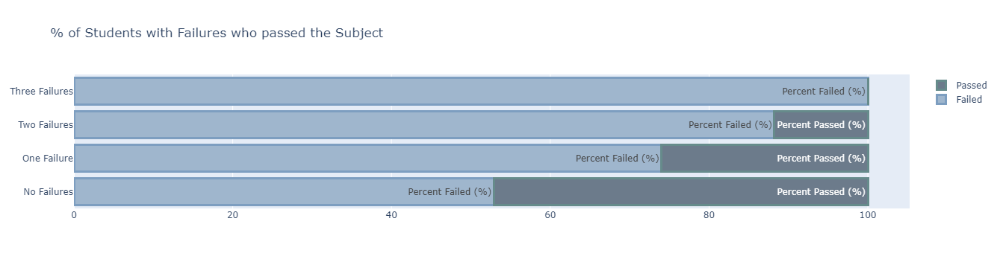

In [384]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()
# Let's see % wise how many people studied 1,2,3 hours.

nofail_fail = cross_failures.iloc[0][0]
nofail_pass = cross_failures.iloc[0][1]
onefail_fail = cross_failures.iloc[1][0]
onefail_pass = cross_failures.iloc[1][1]
twofail_fail = cross_failures.iloc[2][0]
twofail_pass = cross_failures.iloc[2][1]
threefail_fail = cross_failures.iloc[3][0]
threefail_pass = cross_failures.iloc[3][1]

mark1 = Bar(y=['No Failures', 'One Failure', 'Two Failures', 'Three Failures'],x=[nofail_fail, onefail_fail, twofail_fail, threefail_fail],text='Percent Failed (%)',name='Failed',orientation='h',marker= dict(color='#9FB6CD',line = dict(color = '#7D9EC0',width = 3)))

mark2 = Bar(y=['No Failures', 'One Failure', 'Two Failures', 'Three Failures'],x=[nofail_pass, onefail_pass, twofail_pass, threefail_pass],text='Percent Passed (%)',name='Passed',orientation = 'h',marker= dict(color='#6C7B8B',line = dict(color = '#668B8B',width = 3)))

data = [mark1, mark2]
layout = Layout(title = '% of Students with Failures who passed the Subject ',barmode='stack',)

fig = dict(data=data, layout=layout)
iplot(fig)

Interestingly the amount of failures tells us that a student is more likely to fail

**Let analyze the impact of student's absences towards their performances**

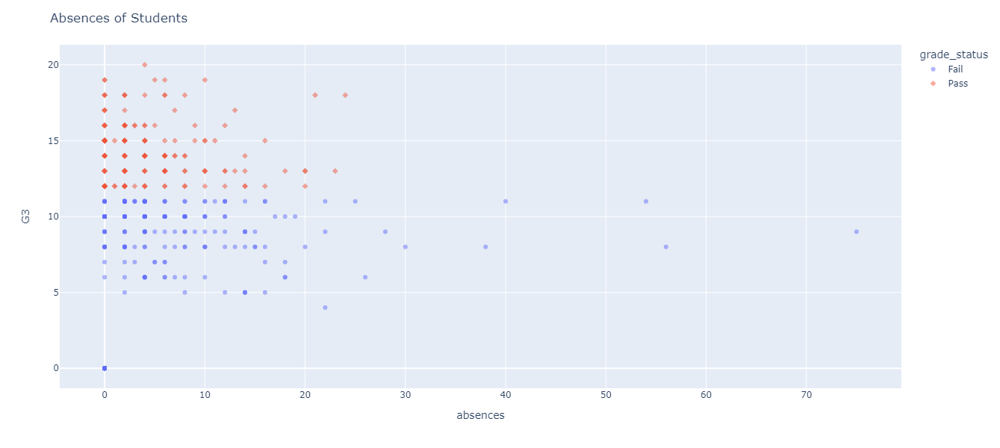

In [313]:
import plotly.express as px
fig = px.scatter(df, x="absences", y="G3", color='grade_status',symbol="grade_status", opacity = .5, height=600, width=900)
fig.layout.update({'title': 'Absences of Students'})
fig.show()

The more absences the more likely the student was going to fail the class

**Conclusion:**

In this project we did a deep analysis of what could be possible factor on whether a student is likely to get a high score or a low score.